# 🤪 WGAN - CelebA Faces

In this notebook, we'll walk through the steps required to train your own Wasserstein GAN on the CelebA faces dataset

The code has been adapted from the excellent [WGAN-GP tutorial](https://keras.io/examples/generative/wgan_gp/) created by Aakash Kumar Nain, available on the Keras website.

In [1]:
import os, sys
sys.path.insert(0, os.path.expanduser("~/gen_deep_learning"))

In [2]:
%load_ext autoreload
%autoreload 2
import numpy as np

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    utils,
    metrics,
    optimizers,
)

from notebooks.utils import display, sample_batch

2026-01-19 04:28:29.311302: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-19 04:28:29.428498: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-19 04:28:29.434209: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2026-01-19 04:28:29.434224: I tensorflow/stream_ex

## 0. Parameters <a name="parameters"></a>

In [21]:
IMAGE_SIZE = 64
CHANNELS = 3
BATCH_SIZE = 512
NUM_FEATURES = 64
Z_DIM = 128
LEARNING_RATE = 0.0002
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
#EPOCHS = 200
EPOCHS = 20
CRITIC_STEPS = 3
GP_WEIGHT = 10.0
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.9

## 1. Prepare the data <a name="prepare"></a>

In [22]:
# Load the data
train_data = utils.image_dataset_from_directory(
    "/home/sagemaker-user/data/img_align_celeba/img_align_celeba",
    labels=None,
    color_mode="rgb",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 202599 files belonging to 1 classes.


In [23]:
# Preprocess the data
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [24]:
# Show some faces from the training set
train_sample = sample_batch(train)

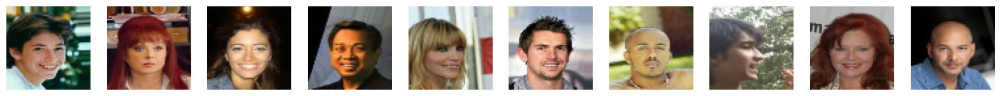

In [25]:
display(train_sample, cmap=None)

## 2. Build the WGAN-GP <a name="build"></a>

In [26]:
critic_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(critic_input)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(1, kernel_size=4, strides=1, padding="valid")(x)
critic_output = layers.Flatten()(x)

critic = models.Model(critic_input, critic_output)
critic.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_6 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 dropout_3 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 8, 8, 256)         5245

In [27]:
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS, kernel_size=4, strides=2, padding="same", activation="tanh"
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128)]             0         
                                                                 
 reshape_1 (Reshape)         (None, 1, 1, 128)         0         
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 4, 4, 512)        1048576   
 ranspose)                                                       
                                                                 
 batch_normalization_4 (Batc  (None, 4, 4, 512)        2048      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 8, 8, 256)        2097

In [28]:
class WGANGP(models.Model):
    def __init__(self, critic, generator, latent_dim, critic_steps, gp_weight):
        super(WGANGP, self).__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.critic_steps = critic_steps
        self.gp_weight = gp_weight

    def compile(self, c_optimizer, g_optimizer):
        super(WGANGP, self).compile()
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer
        self.c_wass_loss_metric = metrics.Mean(name="c_wass_loss")
        self.c_gp_metric = metrics.Mean(name="c_gp")
        self.c_loss_metric = metrics.Mean(name="c_loss")
        self.g_loss_metric = metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [
            self.c_loss_metric,
            self.c_wass_loss_metric,
            self.c_gp_metric,
            self.g_loss_metric,
        ]

    def gradient_penalty(self, batch_size, real_images, fake_images):
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.critic(interpolated, training=True)

        grads = gp_tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]

        for i in range(self.critic_steps):
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )

            with tf.GradientTape() as tape:
                fake_images = self.generator(
                    random_latent_vectors, training=True
                )
                fake_predictions = self.critic(fake_images, training=True)
                real_predictions = self.critic(real_images, training=True)

                c_wass_loss = tf.reduce_mean(fake_predictions) - tf.reduce_mean(
                    real_predictions
                )
                c_gp = self.gradient_penalty(
                    batch_size, real_images, fake_images
                )
                c_loss = c_wass_loss + c_gp * self.gp_weight

            c_gradient = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(
                zip(c_gradient, self.critic.trainable_variables)
            )

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_latent_vectors, training=True)
            fake_predictions = self.critic(fake_images, training=True)
            g_loss = -tf.reduce_mean(fake_predictions)

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )

        self.c_loss_metric.update_state(c_loss)
        self.c_wass_loss_metric.update_state(c_wass_loss)
        self.c_gp_metric.update_state(c_gp)
        self.g_loss_metric.update_state(g_loss)

        return {m.name: m.result() for m in self.metrics}

In [29]:
# Create a GAN
wgangp = WGANGP(
    critic=critic,
    generator=generator,
    latent_dim=Z_DIM,
    critic_steps=CRITIC_STEPS,
    gp_weight=GP_WEIGHT,
)

In [30]:
if LOAD_MODEL:
    wgangp.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [31]:
# Compile the GAN
wgangp.compile(
    c_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [32]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.weights.h5",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
            cmap=None,
        )

Epoch 1/20
2/2 [==============================] - ETA: 0s - c_loss: 4.7425 - c_wass_loss: -2.2633 - c_gp: 0.7006 - g_loss: -0.2305
Saved to ./output/generated_img_000.png


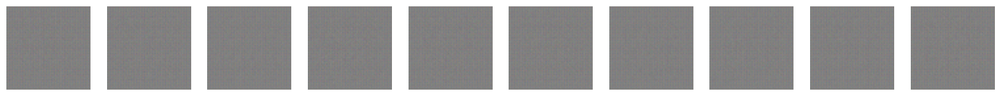

2/2 [==============================] - 31s 13s/step - c_loss: 4.7425 - c_wass_loss: -2.2633 - c_gp: 0.7006 - g_loss: -0.2305
Epoch 2/20
2/2 [==============================] - ETA: 0s - c_loss: -27.1063 - c_wass_loss: -31.3406 - c_gp: 0.4234 - g_loss: -9.4858 
Saved to ./output/generated_img_001.png


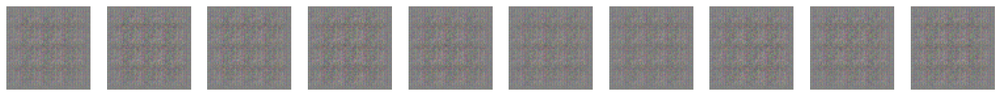

2/2 [==============================] - 26s 13s/step - c_loss: -27.1063 - c_wass_loss: -31.3406 - c_gp: 0.4234 - g_loss: -9.4858
Epoch 3/20
2/2 [==============================] - ETA: 0s - c_loss: -62.5990 - c_wass_loss: -80.4002 - c_gp: 1.7801 - g_loss: -9.2320 
Saved to ./output/generated_img_002.png


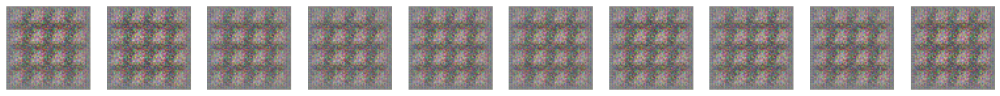

2/2 [==============================] - 26s 13s/step - c_loss: -62.5990 - c_wass_loss: -80.4002 - c_gp: 1.7801 - g_loss: -9.2320
Epoch 4/20
2/2 [==============================] - ETA: 0s - c_loss: -91.9782 - c_wass_loss: -128.0180 - c_gp: 3.6040 - g_loss: 6.7082  
Saved to ./output/generated_img_003.png


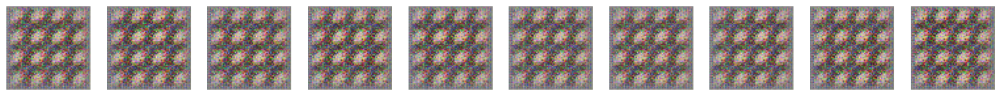

2/2 [==============================] - 26s 13s/step - c_loss: -91.9782 - c_wass_loss: -128.0180 - c_gp: 3.6040 - g_loss: 6.7082
Epoch 5/20
2/2 [==============================] - ETA: 0s - c_loss: -113.3398 - c_wass_loss: -168.6834 - c_gp: 5.5344 - g_loss: 34.6370 
Saved to ./output/generated_img_004.png


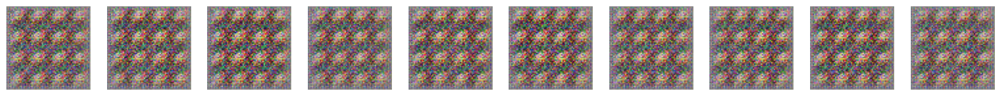

2/2 [==============================] - 25s 13s/step - c_loss: -113.3398 - c_wass_loss: -168.6834 - c_gp: 5.5344 - g_loss: 34.6370
Epoch 6/20
2/2 [==============================] - ETA: 0s - c_loss: -109.6660 - c_wass_loss: -168.7412 - c_gp: 5.9075 - g_loss: 22.0095 
Saved to ./output/generated_img_005.png


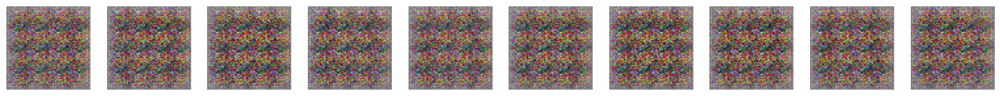

2/2 [==============================] - 24s 12s/step - c_loss: -109.6660 - c_wass_loss: -168.7412 - c_gp: 5.9075 - g_loss: 22.0095
Epoch 7/20
2/2 [==============================] - ETA: 0s - c_loss: -99.8972 - c_wass_loss: -152.7897 - c_gp: 5.2892 - g_loss: 6.2164  
Saved to ./output/generated_img_006.png


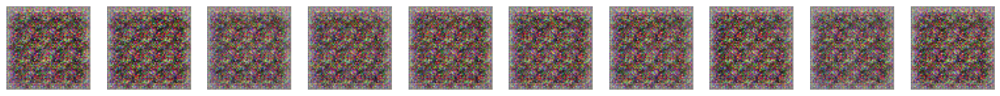

2/2 [==============================] - 26s 13s/step - c_loss: -99.8972 - c_wass_loss: -152.7897 - c_gp: 5.2892 - g_loss: 6.2164
Epoch 8/20
2/2 [==============================] - ETA: 0s - c_loss: -99.3981 - c_wass_loss: -146.8818 - c_gp: 4.7484 - g_loss: 0.9488   
Saved to ./output/generated_img_007.png


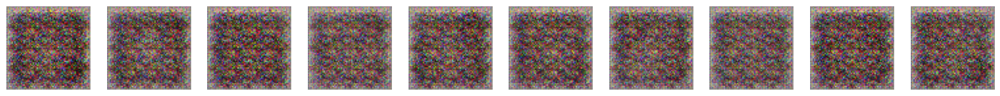

2/2 [==============================] - 26s 13s/step - c_loss: -99.3981 - c_wass_loss: -146.8818 - c_gp: 4.7484 - g_loss: 0.9488
Epoch 9/20
2/2 [==============================] - ETA: 0s - c_loss: -96.4328 - c_wass_loss: -145.6497 - c_gp: 4.9217 - g_loss: 12.4759
Saved to ./output/generated_img_008.png


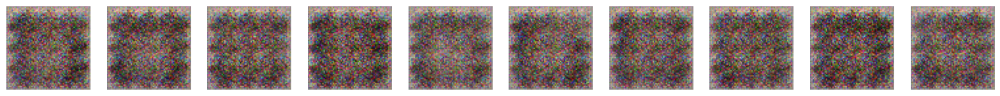

2/2 [==============================] - 26s 13s/step - c_loss: -96.4328 - c_wass_loss: -145.6497 - c_gp: 4.9217 - g_loss: 12.4759
Epoch 10/20
2/2 [==============================] - ETA: 0s - c_loss: -94.5996 - c_wass_loss: -141.8576 - c_gp: 4.7258 - g_loss: 9.4129 
Saved to ./output/generated_img_009.png


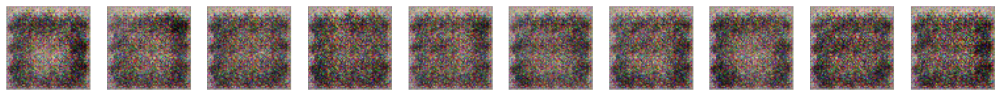

2/2 [==============================] - 26s 13s/step - c_loss: -94.5996 - c_wass_loss: -141.8576 - c_gp: 4.7258 - g_loss: 9.4129
Epoch 11/20
2/2 [==============================] - ETA: 0s - c_loss: -91.1441 - c_wass_loss: -143.3277 - c_gp: 5.2184 - g_loss: 19.0647 
Saved to ./output/generated_img_010.png


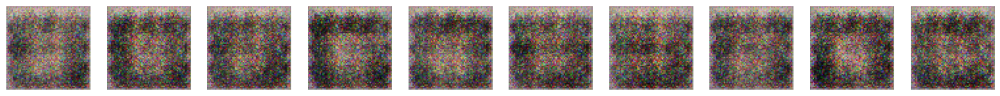

2/2 [==============================] - 25s 13s/step - c_loss: -91.1441 - c_wass_loss: -143.3277 - c_gp: 5.2184 - g_loss: 19.0647
Epoch 12/20
2/2 [==============================] - ETA: 0s - c_loss: -85.6666 - c_wass_loss: -129.9553 - c_gp: 4.4289 - g_loss: 4.9116 
Saved to ./output/generated_img_011.png


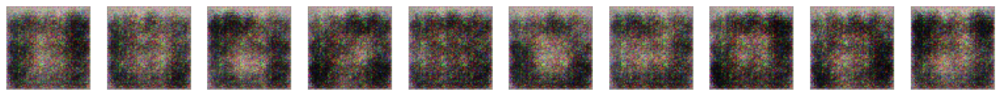

2/2 [==============================] - 24s 12s/step - c_loss: -85.6666 - c_wass_loss: -129.9553 - c_gp: 4.4289 - g_loss: 4.9116
Epoch 13/20
2/2 [==============================] - ETA: 0s - c_loss: -74.0189 - c_wass_loss: -109.2434 - c_gp: 3.5225 - g_loss: -9.6892 
Saved to ./output/generated_img_012.png


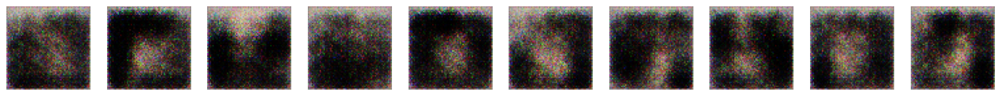

2/2 [==============================] - 25s 13s/step - c_loss: -74.0189 - c_wass_loss: -109.2434 - c_gp: 3.5225 - g_loss: -9.6892
Epoch 14/20
2/2 [==============================] - ETA: 0s - c_loss: -54.5265 - c_wass_loss: -78.4493 - c_gp: 2.3923 - g_loss: -29.8314 
Saved to ./output/generated_img_013.png


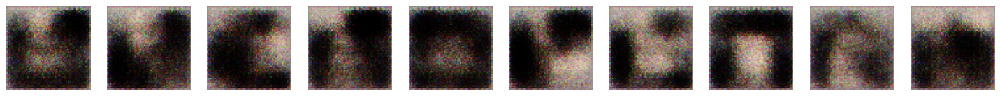

2/2 [==============================] - 24s 12s/step - c_loss: -54.5265 - c_wass_loss: -78.4493 - c_gp: 2.3923 - g_loss: -29.8314
Epoch 15/20
2/2 [==============================] - ETA: 0s - c_loss: -38.5109 - c_wass_loss: -53.3605 - c_gp: 1.4850 - g_loss: -44.2641 
Saved to ./output/generated_img_014.png


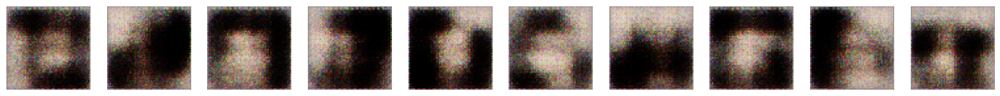

2/2 [==============================] - 24s 12s/step - c_loss: -38.5109 - c_wass_loss: -53.3605 - c_gp: 1.4850 - g_loss: -44.2641
Epoch 16/20
2/2 [==============================] - ETA: 0s - c_loss: -30.5809 - c_wass_loss: -41.0630 - c_gp: 1.0482 - g_loss: -46.3264 
Saved to ./output/generated_img_015.png


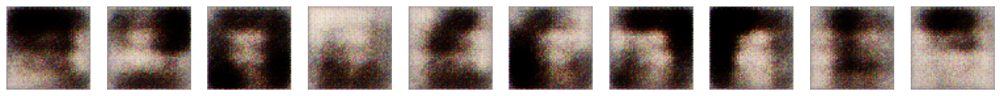

2/2 [==============================] - 24s 12s/step - c_loss: -30.5809 - c_wass_loss: -41.0630 - c_gp: 1.0482 - g_loss: -46.3264
Epoch 17/20
2/2 [==============================] - ETA: 0s - c_loss: -25.2790 - c_wass_loss: -32.7523 - c_gp: 0.7473 - g_loss: -38.1805 
Saved to ./output/generated_img_016.png


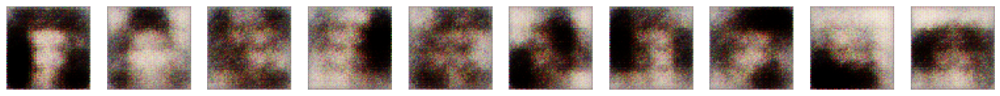

2/2 [==============================] - 24s 12s/step - c_loss: -25.2790 - c_wass_loss: -32.7523 - c_gp: 0.7473 - g_loss: -38.1805
Epoch 18/20
2/2 [==============================] - ETA: 0s - c_loss: -23.5844 - c_wass_loss: -29.9627 - c_gp: 0.6378 - g_loss: -37.2617 
Saved to ./output/generated_img_017.png


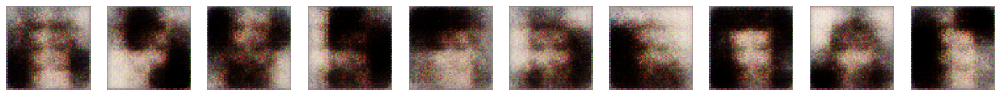

2/2 [==============================] - 24s 12s/step - c_loss: -23.5844 - c_wass_loss: -29.9627 - c_gp: 0.6378 - g_loss: -37.2617
Epoch 19/20
2/2 [==============================] - ETA: 0s - c_loss: -22.5899 - c_wass_loss: -28.3305 - c_gp: 0.5741 - g_loss: -34.5201 
Saved to ./output/generated_img_018.png


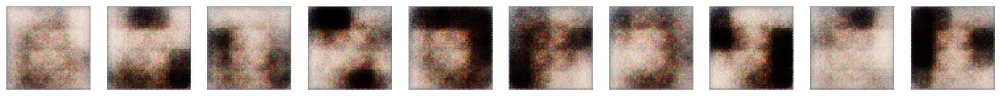

2/2 [==============================] - 24s 12s/step - c_loss: -22.5899 - c_wass_loss: -28.3305 - c_gp: 0.5741 - g_loss: -34.5201
Epoch 20/20
2/2 [==============================] - ETA: 0s - c_loss: -20.2992 - c_wass_loss: -25.1023 - c_gp: 0.4803 - g_loss: -21.9640 
Saved to ./output/generated_img_019.png


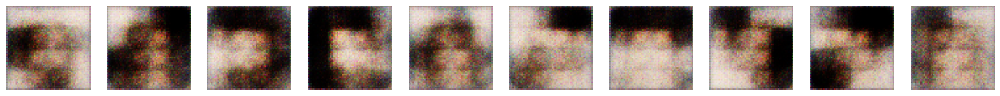

2/2 [==============================] - 24s 12s/step - c_loss: -20.2992 - c_wass_loss: -25.1023 - c_gp: 0.4803 - g_loss: -21.9640


In [33]:
wgangp.fit(
    train,
    epochs=EPOCHS,
    steps_per_epoch=2,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [34]:
# Save the final models
generator.save("./models/generator")
critic.save("./models/critic")

## Generate images

1/1 [==============================] - 0s 138ms/step


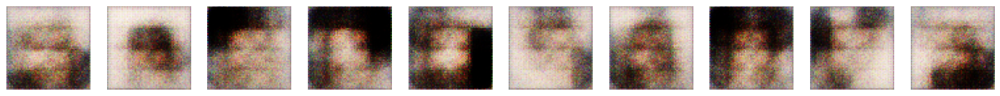

In [35]:
z_sample = np.random.normal(size=(10, Z_DIM))
imgs = wgangp.generator.predict(z_sample)
display(imgs, cmap=None)